# **Using Transfer Learning and TensorFlow 2.0 to Classify Different Dog Breeds**

## 1. **Problem Definition**
Identifying the breed of a dog given an image of the dog.
## 2. **Data**
From kaggle.
## 3. **Evaluation**
The evaluation is a file with prediction probabilities for each dog breed of each test image.
## 4. **Features**
* The data used is unstructured so it is best to use deep learning or transfer learning
* There are 120 different breeds of dogs (120 different classes).
* There are around 10,000+ images in the training set.
* There are around 10,000+ images in the test set.


In [ ]:
# unzip the uploaded data into Google Drive
!unzip "drive/MyDrive/DogIdentificationProject/dog-breed-identification.zip" -d "drive/MyDrive/DogIdentificationProject"

Streaming output truncated to the last 5000 lines.
  inflating: drive/MyDrive/DogIdentificationProject/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83fad0718581a696132c96c166472627.jpg  
  inflating: drive/MyDrive/DogIdentificationProject/train/83fbbcc9a612e3f712

## **Workspace**


In [1]:
# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF version", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

TF version 2.12.0
TF version 0.13.0
GPU available


### **Turning data into Tensors** **bold text**

In [2]:
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/DogIdentificationProject/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [3]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


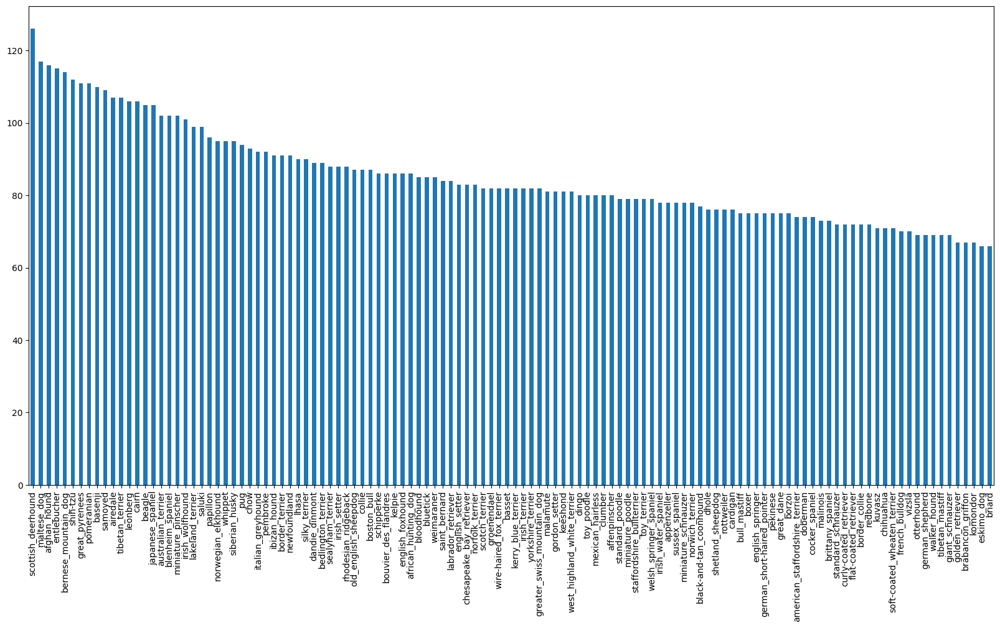

In [4]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20, 10));

In [5]:
labels_csv["breed"].value_counts().median()

82.0

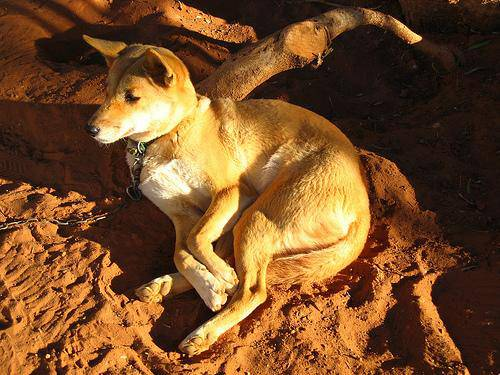

In [6]:
# view an image
from IPython.display import Image
Image("drive/MyDrive/DogIdentificationProject/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
# create pathnames from image IDs
filenames = ["drive/MyDrive/DogIdentificationProject/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/DogIdentificationProject/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/DogIdentificationProject/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/DogIdentificationProject/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/DogIdentificationProject/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/DogIdentificationProject/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/DogIdentificationProject/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/DogIdentificationProject/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/DogIdentificationProject/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/DogIdentificationProject/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/DogIdentificationProject/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [9]:
import os
if len(os.listdir("drive/MyDrive/DogIdentificationProject/train/")) == len(filenames):
  print("Filenames match the actual amount of files.")
else:
  print("Filenames doesnt match the actual amount of files.")  

Filenames match the actual amount of files.


In [10]:
len(os.listdir("drive/MyDrive/DogIdentificationProject/train/"))

10222

In [11]:
len(filenames)

10222

In [12]:
import numpy as np
labels = np.array(labels_csv["breed"])
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [13]:
len(labels)

10222

In [14]:
if len(labels) == len(filenames):
  print("Number of labels matches the number of filenames")
else: 
  print("Number of labels doesnt match the number of filenames")  

Number of labels matches the number of filenames


In [15]:
unique_breeds = np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [16]:
len(unique_breeds)

120

In [17]:

boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [18]:
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### **Creating validation set**

In [19]:
x = filenames
y = boolean_labels

In [20]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}
NUM_IMAGES

1000

In [21]:

# Import train_test_split from Scikit-Learn
from sklearn.model_selection import train_test_split

# Split them into training and validation using NUM_IMAGES 
x_train, x_val, y_train, y_val = train_test_split(x[:NUM_IMAGES],
                                                  y[:NUM_IMAGES], 
                                                  test_size=0.2,
                                                  random_state=42)

len(x_train), len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [22]:
# Check out the training data (image file paths and labels)
x_train[:5], y_train[:2]

(['drive/MyDrive/DogIdentificationProject/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/DogIdentificationProject/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/DogIdentificationProject/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/DogIdentificationProject/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/DogIdentificationProject/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, Fa

### **Preprocessing images (turning images into Tensors)**

In [23]:
# convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [24]:
image.max(), image.min()

(255, 0)

In [25]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [26]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [27]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

### **Turning data into batches**

In [28]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [29]:
(process_image(x[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [30]:
# Define the batch size, 32 is a good default
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [31]:

train_data = create_data_batches(x_train, y_train)
val_data = create_data_batches(x_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [32]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### **Visualizing data batches**

In [33]:
import matplotlib.pyplot as plt

def show_25_images(images, label): 
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[label[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [34]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [35]:
unique_breeds[y[0].argmax()]

'boston_bull'

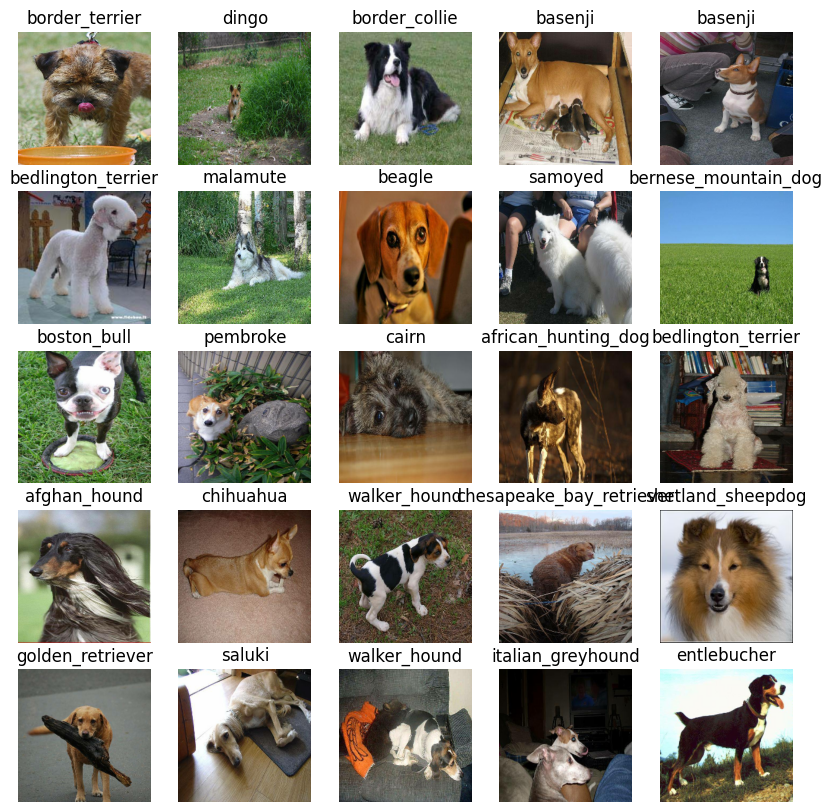

In [36]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
show_25_images(train_images, train_labels)

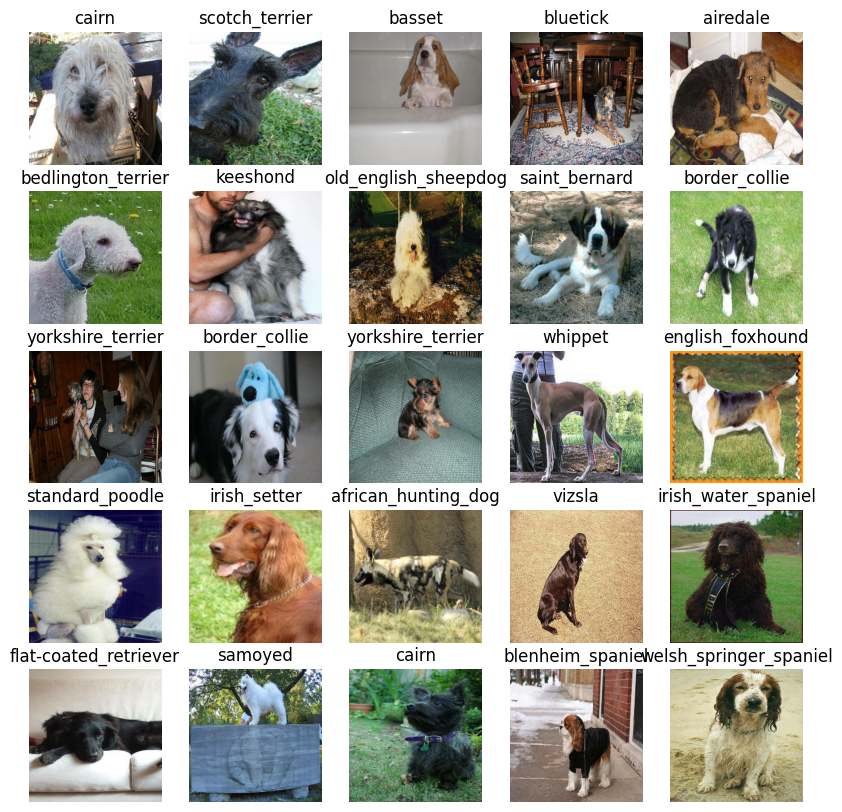

In [37]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [38]:
IMG_SIZE

224

In [39]:
# setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]

# setup output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# setup model URL from TensorFlow hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [40]:
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with: ", MODEL_URL)
  
  # Setup the model layer
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the layer
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # tells model how to improve its guesses
      metrics=["accuracy"]
  )

   # Build the model
  model.build(INPUT_SHAPE)
  
  return model

In [41]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


### **Creating Callbacks**

In [42]:
%load_ext tensorboard

In [43]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/MyDrive/DogIdentificationProject/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### **Early Stopping Callback**

In [44]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy", 
                                                  patience=3)

### **Training the model (on a subset of data)**

In [45]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

In [46]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [47]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 116s 3s/step - loss: 4.6678 - accuracy: 0.0775 - val_loss: 3.3007 - val_accuracy: 0.2800
Epoch 2/100
25/25 [==============================] - 3s 125ms/step - loss: 1.7042 - accuracy: 0.6712 - val_loss: 2.0427 - val_accuracy: 0.5250
Epoch 3/100
25/25 [==============================] - 4s 144ms/step - loss: 0.5828 - accuracy: 0.9325 - val_loss: 1.5476 - val_accuracy: 0.6150
Epoch 4/100
25/25 [==============================] - 4s 148ms/step - loss: 0.2684 - accuracy: 0.9812 - val_loss: 1.3672 - val_accuracy: 0.6450
Epoch 5/100
25/25 [==============================] - 3s 116ms/step - loss: 0.1523 - accuracy: 0.9962 - val_loss: 1.2734 - val_accuracy: 0.6600
Epoch 6/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1022 - accuracy: 1.0000 - val_loss: 1.2354 - val_accuracy: 0.6400
Epoch 7/100
25/25 [==============================

In [48]:
%tensorboard --logdir drive/MyDrive/DogIdentificationProject/logs

<IPython.core.display.Javascript object>

In [49]:
predictions = model.predict(val_data, verbose=1) 
predictions

7/7 [==============================] - 5s 90ms/step


array([[2.4349778e-03, 2.4651509e-04, 7.4451170e-03, ..., 6.0201512e-04,
        4.4360848e-05, 2.0479819e-02],
       [2.6196875e-03, 4.9233995e-04, 1.5453836e-02, ..., 1.4158521e-03,
        2.0540757e-02, 6.4152671e-04],
       [5.5611613e-06, 6.7250439e-05, 9.1787479e-05, ..., 1.6456033e-04,
        4.4497120e-04, 2.2411706e-04],
       ...,
       [1.6147713e-06, 1.3682617e-04, 1.4535928e-04, ..., 1.9873612e-05,
        8.6415501e-05, 8.6972912e-05],
       [1.7368123e-03, 9.9840363e-05, 1.0927153e-04, ..., 2.0788546e-04,
        4.4571050e-05, 6.8789413e-03],
       [7.7485532e-04, 6.8449022e-05, 1.4099388e-03, ..., 5.9331520e-03,
        4.0915288e-04, 1.4038949e-04]], dtype=float32)

In [50]:
predictions.shape

(200, 120)

In [51]:
len(y_val)

200

In [52]:
len(predictions[0])

120

In [53]:
np.sum(predictions[0])

1.0

In [54]:
np.sum(predictions[1])

1.0

In [55]:
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}")
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[2.43497780e-03 2.46515090e-04 7.44511699e-03 2.25205935e-04
 1.08357868e-03 5.71448945e-05 1.77945532e-02 3.37752397e-04
 6.46106666e-04 4.07214859e-04 2.05787877e-03 3.06901959e-04
 1.09897534e-04 5.20017529e-05 7.83473311e-04 2.94205704e-04
 1.81389420e-04 2.75077879e-01 9.41778344e-05 6.58036210e-04
 1.07053638e-04 4.25372156e-04 1.08479609e-04 7.21108867e-03
 4.45534097e-05 2.44308088e-04 1.04243502e-01 7.03944825e-05
 3.84709390e-04 9.86503204e-04 4.19750344e-04 2.18732096e-03
 2.14150688e-03 2.41125472e-05 9.25036511e-05 2.21426338e-02
 2.39470799e-04 6.51257636e-04 4.89813756e-05 1.13362163e-04
 4.49657626e-03 1.97692425e-04 2.50904239e-03 2.55028158e-03
 4.83346994e-05 5.97898725e-05 8.23706287e-05 8.23803304e-04
 3.91268492e-04 1.71384178e-04 2.10371552e-04 9.09904265e-05
 1.88101130e-03 2.97544990e-04 5.78754698e-04 1.99416114e-04
 1.60567593e-04 9.79417353e-04 1.11706823e-03 1.09705091e-01
 1.66487531e-04 1.52210278e-05 3.35466932e-03 4.21075238e-05
 3.52667936e-04 1.141471

In [56]:
def get_pred_labels(prediction_probabilities):
  """
  Turns an array of prediciton probabilites into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

pred_label = get_pred_labels(predictions[0])
pred_label  

'border_terrier'

In [57]:

val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [58]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [59]:
get_pred_labels(val_images[0])

'vizsla'

In [60]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_labels(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

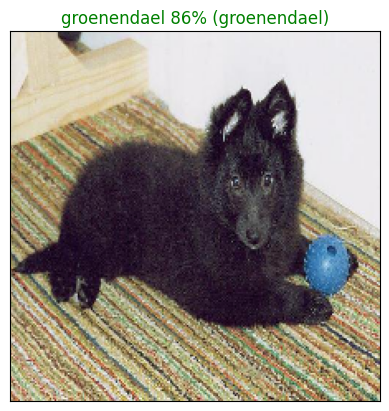

In [61]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, 
          n=77)

In [62]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]
  
  pred_label = get_pred_labels(pred_prob)

  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]

  top_10_pred_values = pred_prob[top_10_pred_indexes]

  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

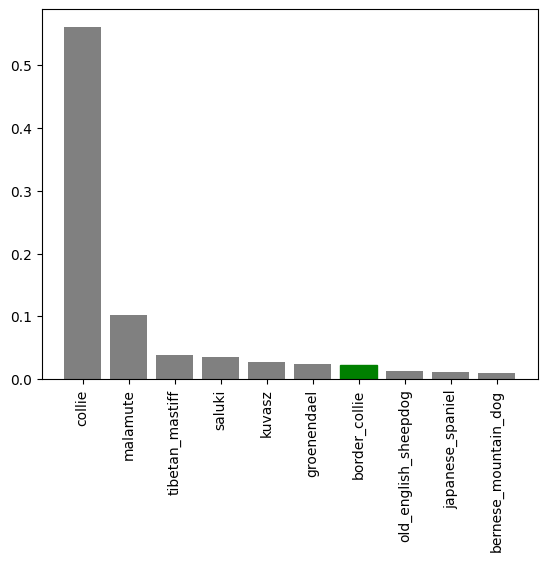

In [63]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

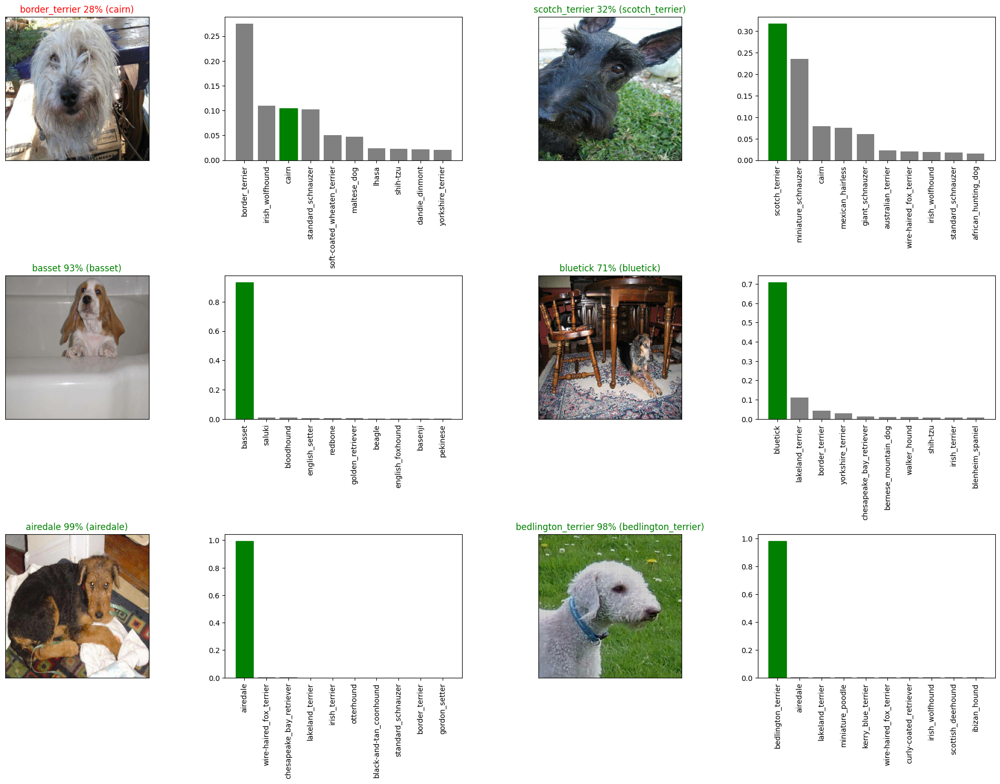

In [64]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

In [65]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/MyDrive/DogIdentificationProject/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [66]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [67]:
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/MyDrive/DogIdentificationProject/models/20230604-06251685859916-1000-images-Adam.h5...


'drive/MyDrive/DogIdentificationProject/models/20230604-06251685859916-1000-images-Adam.h5'

In [68]:
model.evaluate(val_data)

7/7 [==============================] - 1s 85ms/step - loss: 1.1822 - accuracy: 0.6600


[1.182236909866333, 0.6600000262260437]

In [69]:
len(x), len(y)

(10222, 10222)

In [70]:

len(x_train)

800

In [71]:
full_data = create_data_batches(x, y)

Creating training data batches...


In [72]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [73]:
full_model = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [74]:
full_model_tensorboard = create_tensorboard_callback()

full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)

In [75]:
full_model.fit(x=full_data, 
               epochs=NUM_EPOCHS, 
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 39s 108ms/step - loss: 1.3124 - accuracy: 0.6694
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.3994 - accuracy: 0.8807
Epoch 3/100
320/320 [==============================] - 34s 105ms/step - loss: 0.2370 - accuracy: 0.9331
Epoch 4/100
320/320 [==============================] - 34s 107ms/step - loss: 0.1527 - accuracy: 0.9628
Epoch 5/100
320/320 [==============================] - 33s 104ms/step - loss: 0.1053 - accuracy: 0.9799
Epoch 6/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0760 - accuracy: 0.9871
Epoch 7/100
320/320 [==============================] - 32s 101ms/step - loss: 0.0571 - accuracy: 0.9925
Epoch 8/100
320/320 [==============================] - 33s 103ms/step - loss: 0.0464 - accuracy: 0.9950
Epoch 9/100
320/320 [==============================] - 33s 102ms/step - loss: 0.0380 - accuracy: 0.9959
Epoch 10/100
320/320 [==============================] - 33s 104m

In [76]:
save_model(full_model, suffix="all-images-Adam")

Saving model to: drive/MyDrive/DogIdentificationProject/models/20230604-06371685860676-all-images-Adam.h5...


'drive/MyDrive/DogIdentificationProject/models/20230604-06371685860676-all-images-Adam.h5'

In [77]:
loaded_full_model = load_model('drive/MyDrive/DogIdentificationProject/models/20230603-09251685784333-all-images-Adam.h5')

Loading saved model from: drive/MyDrive/DogIdentificationProject/models/20230603-09251685784333-all-images-Adam.h5


### **Making predictions on test data**

In [78]:
test_path = "drive/MyDrive/DogIdentificationProject/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

test_filenames[:10]

['drive/MyDrive/DogIdentificationProject/test/e783e22d4f370b6cc0b1f44b4d6584a8.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e0165801e47527205e45295aba441972.jpg',
 'drive/MyDrive/DogIdentificationProject/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e3982348ad8b974cef2298f741bc3c99.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e4f8465214c9644b10c536ecb087b7be.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e6999e18a8e98f7fc33cf520d26ec521.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e6a544a538088cc3f73b432a2da90134.jpg',
 'drive/MyDrive/DogIdentificationProject/test/e18a9e69da19fc1a19885d15b7f26e92.jpg',
 'drive/MyDrive/DogIdentificationProject/test/ddf2401701ee374c0f1f9dd607071ec7.jpg']

In [79]:
len(test_filenames)

10357

In [80]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [81]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [83]:
test_predictions = loaded_full_model.predict(test_data,
                                              verbose=1)

324/324 [==============================] - 33s 100ms/step


In [84]:
np.savetxt("drive/MyDrive/DogIdentificationProject/preds_array.csv", test_predictions, delimiter=",") 

In [85]:
test_predictions = np.loadtxt("drive/MyDrive/DogIdentificationProject/preds_array.csv", delimiter=",")

In [86]:
test_predictions[:10]

array([[2.26090606e-07, 3.76672686e-11, 1.07753744e-08, ...,
        1.35807959e-05, 1.81450199e-09, 3.86192944e-09],
       [2.89530853e-08, 2.42582376e-09, 1.53418593e-08, ...,
        1.63632139e-05, 7.08577419e-10, 3.07487313e-10],
       [4.90391755e-11, 6.13052553e-10, 1.15851877e-11, ...,
        2.11508345e-14, 3.63191465e-12, 8.66115881e-13],
       ...,
       [1.29565209e-13, 1.61132691e-10, 3.26365296e-07, ...,
        4.81245042e-05, 1.15309220e-08, 5.66902324e-11],
       [9.73309877e-10, 1.17958823e-10, 3.55797086e-10, ...,
        1.17746019e-07, 1.24656147e-10, 1.38190032e-11],
       [1.61889886e-06, 1.40094664e-06, 2.06247552e-08, ...,
        4.72514103e-07, 8.69317773e-07, 7.42509670e-04]])

In [87]:
test_predictions.shape

(10357, 120)

In [88]:
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [89]:
test_path = "drive/MyDrive/DogIdentificationProject/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e0165801e47527205e45295aba441972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,dea92807aa2ac37bbc2dabf1b0eb6a39,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e3982348ad8b974cef2298f741bc3c99,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e4f8465214c9644b10c536ecb087b7be,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [90]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e783e22d4f370b6cc0b1f44b4d6584a8,2.260906e-07,3.766727e-11,1.077537e-08,1.150455e-08,5.204845e-07,1.803968e-08,6.556827e-11,8.747832e-08,9.317814e-11,...,4.885783e-09,1.389955e-08,1.939045e-07,1.005575e-09,3.838249e-08,2.713863e-11,2.725933e-09,1.358080e-05,1.814502e-09,3.861929e-09
1,e0165801e47527205e45295aba441972,2.895309e-08,2.425824e-09,1.534186e-08,1.629209e-06,1.547502e-05,4.725965e-09,1.693666e-07,2.443727e-06,8.171151e-07,...,1.995257e-09,3.073798e-08,2.092846e-06,2.022778e-08,3.642475e-09,1.351682e-09,2.187157e-12,1.636321e-05,7.085774e-10,3.074873e-10
2,dea92807aa2ac37bbc2dabf1b0eb6a39,4.903918e-11,6.130526e-10,1.158519e-11,2.115085e-09,1.307570e-13,1.513356e-10,4.092478e-12,8.041879e-12,2.195128e-13,...,1.538882e-08,1.063893e-12,4.322859e-14,3.277704e-11,1.455397e-10,4.889739e-15,1.914054e-14,2.115083e-14,3.631915e-12,8.661159e-13
3,e3982348ad8b974cef2298f741bc3c99,6.292935e-10,4.907228e-10,1.076532e-07,6.931830e-11,6.614216e-09,7.704667e-09,1.691468e-09,5.109864e-08,7.802869e-12,...,6.663943e-09,3.490643e-07,2.464592e-11,1.083304e-06,7.483032e-09,8.096703e-10,1.895859e-08,5.467323e-10,7.711503e-09,1.891266e-07
4,e4f8465214c9644b10c536ecb087b7be,2.110901e-08,5.560008e-09,8.340576e-09,3.565241e-08,1.101084e-09,4.205805e-07,5.638128e-12,9.346678e-11,5.356887e-13,...,7.626190e-12,3.554916e-10,7.699282e-12,3.253224e-08,3.225693e-07,5.365298e-11,9.858920e-12,8.138145e-08,1.370008e-08,1.215252e-11


In [91]:
preds_df.to_csv("drive/MyDrive/DogIdentificationProject/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

### **Making predictions on custom images**

In [92]:
custom_path = "drive/MyDrive/DogIdentificationProject/custom_images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]
custom_image_paths

['drive/MyDrive/DogIdentificationProject/custom_images/foxhound_dog_canine.jpg',
 'drive/MyDrive/DogIdentificationProject/custom_images/dog_lying_193003.jpg']

In [93]:
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [94]:
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 1s/step


In [95]:
custom_pred_labels = [get_pred_labels(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['miniature_pinscher', 'leonberg']

In [96]:
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

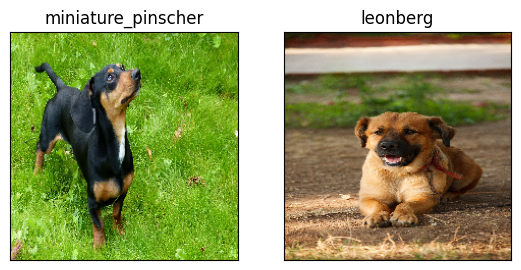

In [97]:
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)